### Illustration of low-rank approximations

In the following, you will find the denoising example shown in the lecture.

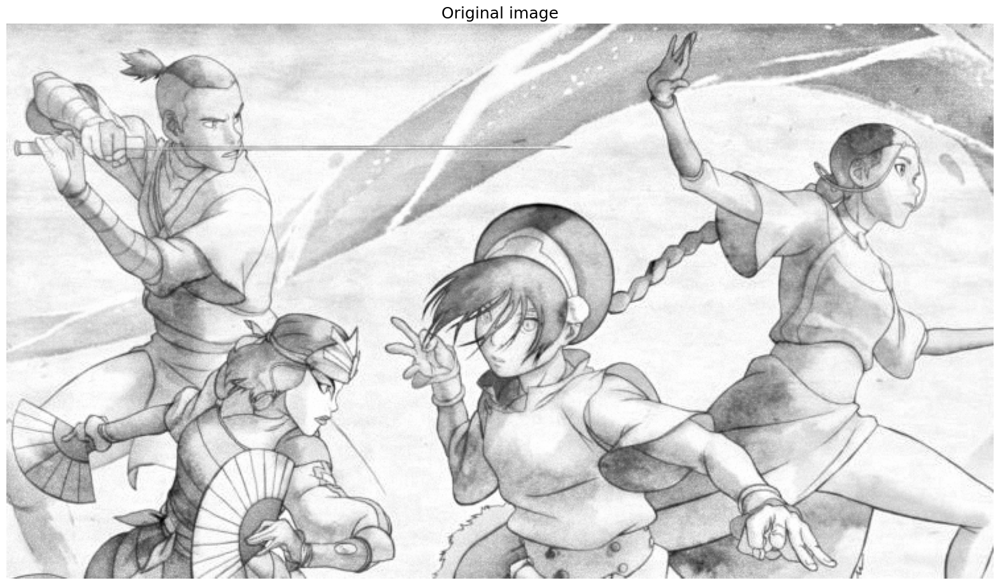

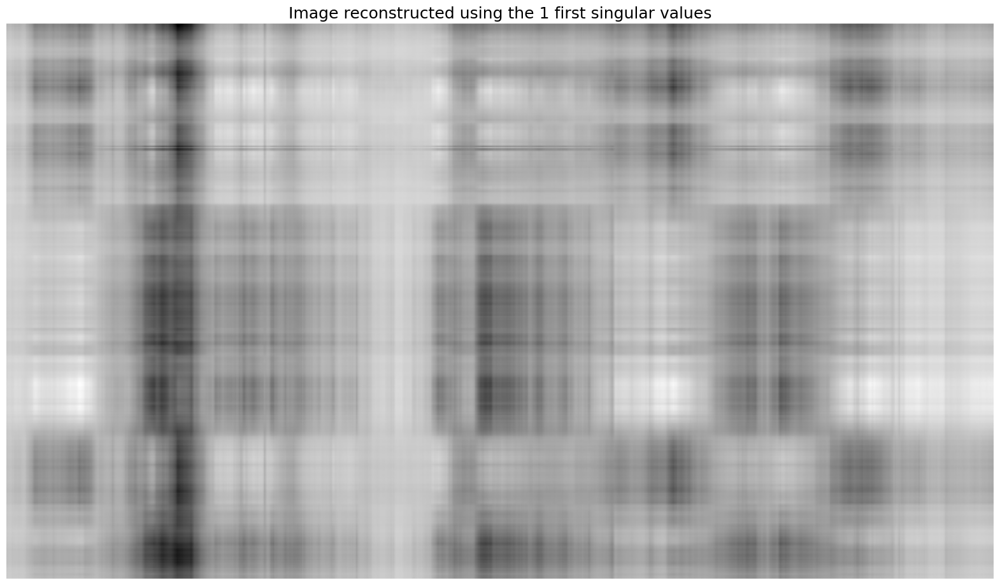

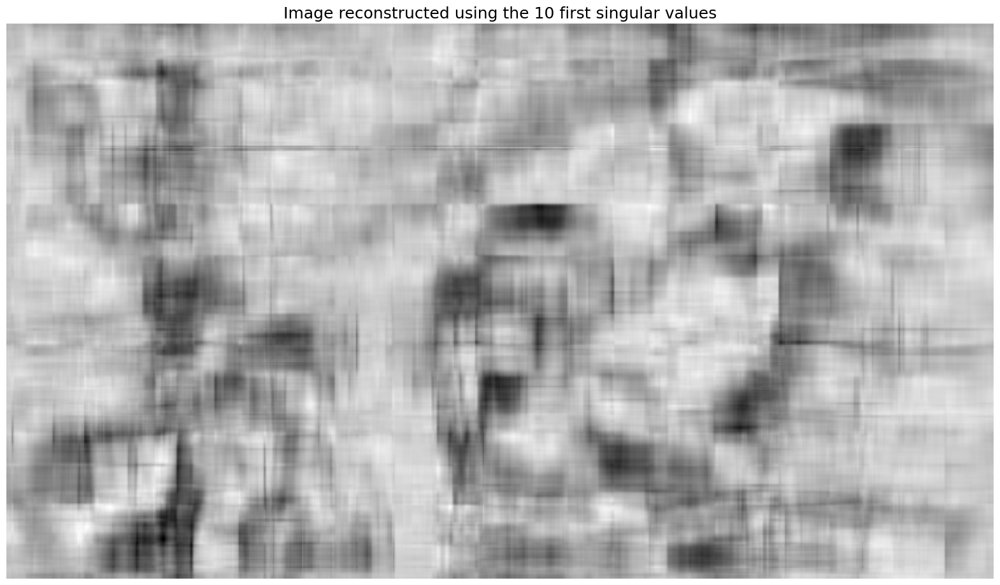

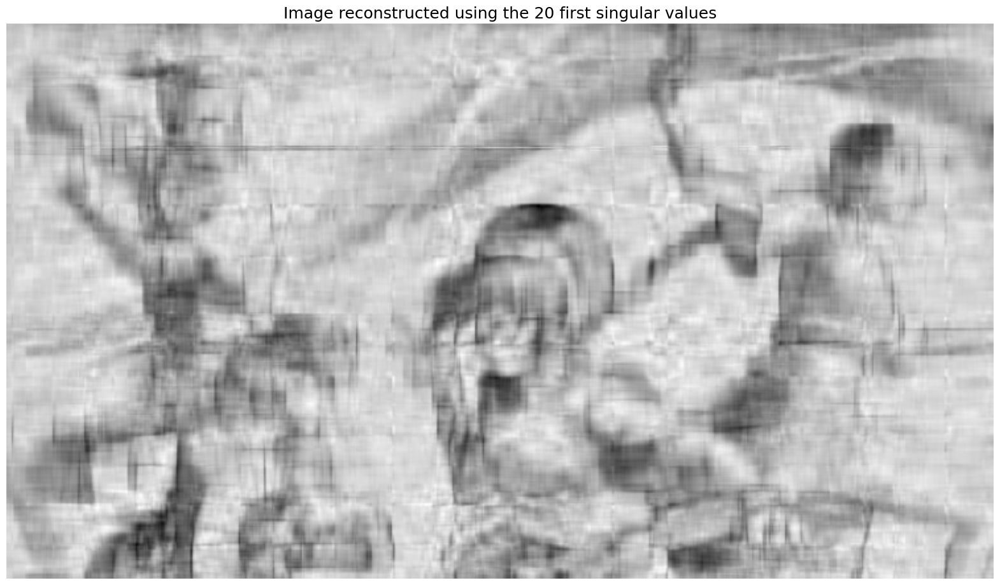

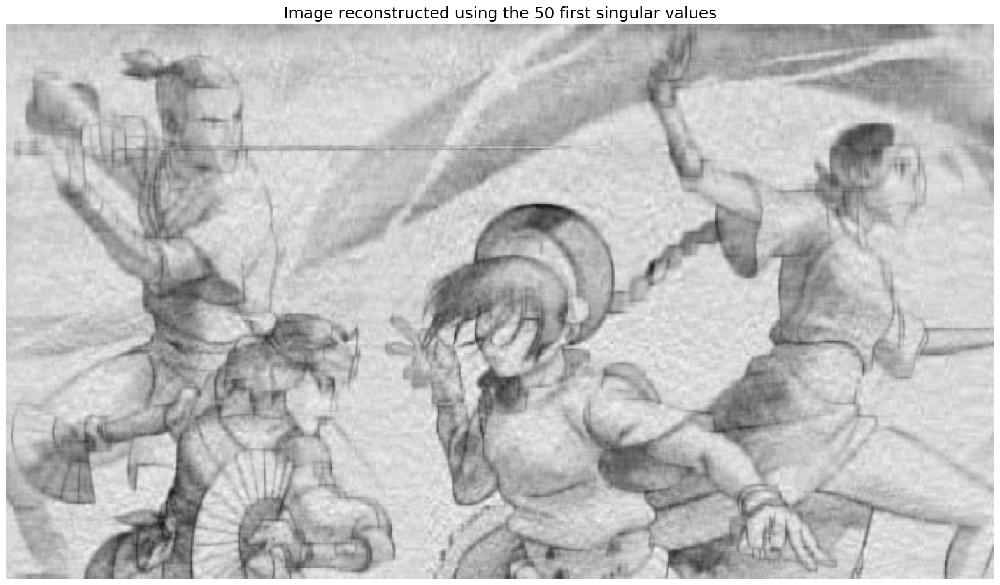

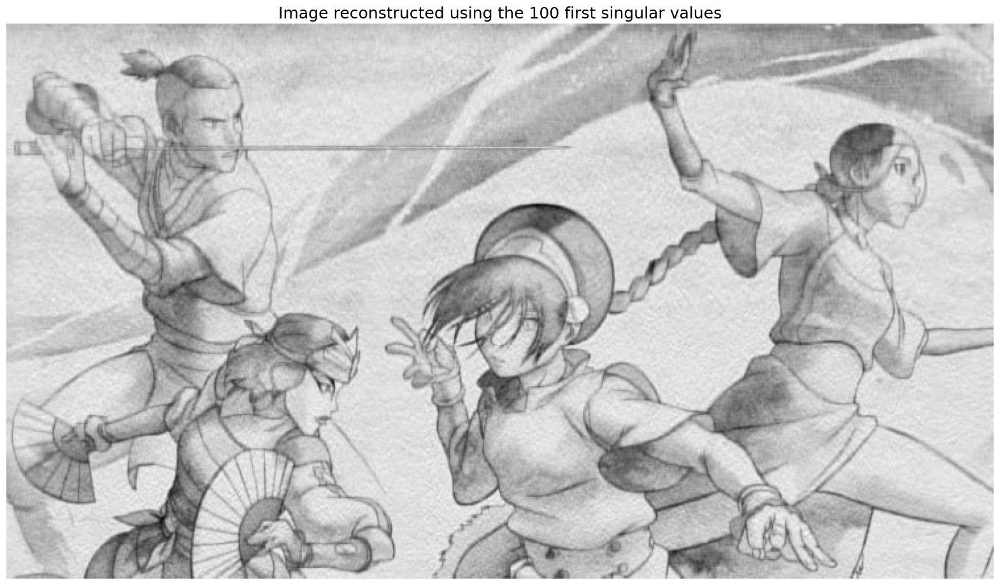

In [7]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = './avatar_image.jpg'
image = np.array(Image.open(image_path).convert('L'))

image = 1 - image / 255

# Look at the pictures (note: there is noise!)
plt.figure(figsize=(20,20))
plt.imshow(image, cmap='gray_r')
plt.title('Original image', fontsize=18)
_ = plt.axis('off')

# perform singular value decomposition
U, s, V = np.linalg.svd(image)

def lowrank_approx(U, s, V, k):
    '''
    Given  a singular value decomposition UsV, returns a low-rank approximation
    using the k highest singular values
    '''
    U_red = U[:,:k] 
    s_red = s[:k]
    V_red = V[:k, :]
    return U_red @ np.diag(s_red) @ V_red

# Perform low-rank approximations for different compression rates 
# (i.e., numebr of singular values used in the reconstruction of the image)
all_images = []
for i in range(1,201):
    all_images.append(lowrank_approx(U, s, V, i))


for i in [1, 10, 20, 50, 100]:
    plt.figure(figsize=(20,20))
    plt.imshow(all_images[i], cmap='gray_r')
    plt.title('Image reconstructed using the {} first singular values'.format(i), fontsize=18)
    _ = plt.axis('off')

#### Let's use SVD to fix missing values in the image! 

First, we add salt and pepper noise to remove some of the pixel values. 

Then we perform a SVD and use it to reconstruct the original image. From this reconstruction, we obtain new values for the missing pixels! We fill these into the original image.

This is repeated for a low-rank approximation using 40 singular values and 200 singular values. If the rank is too high, we start reconstructing the noise!

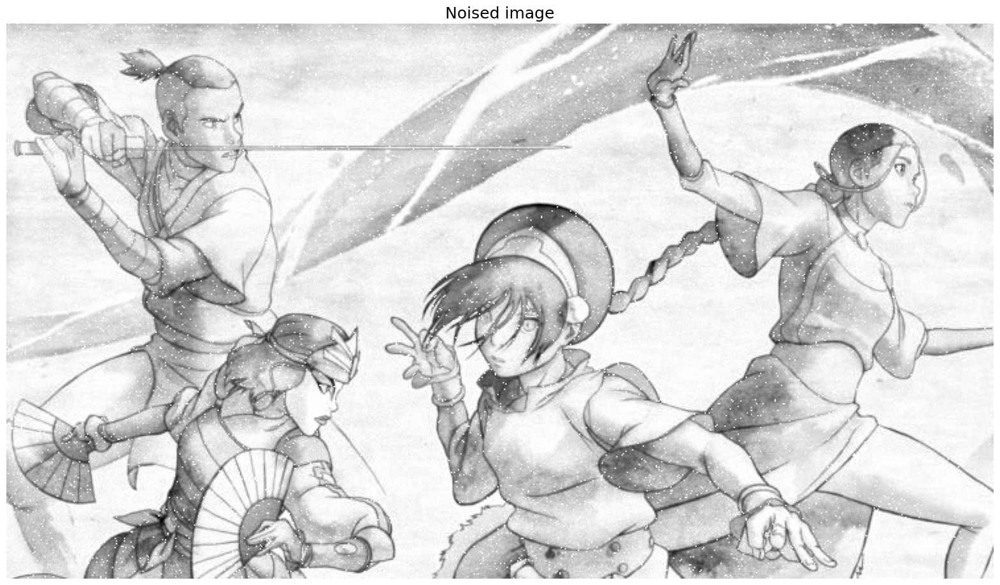

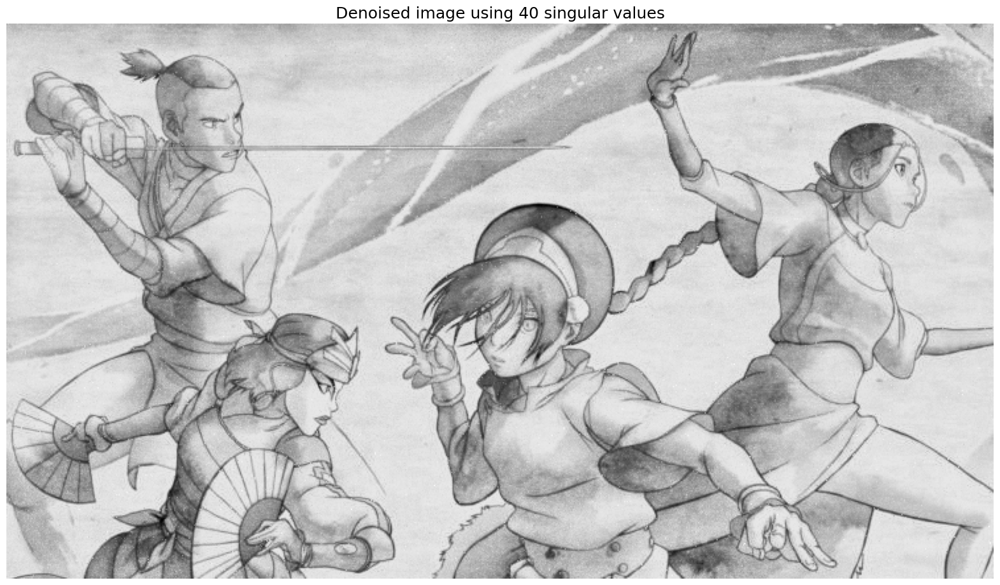

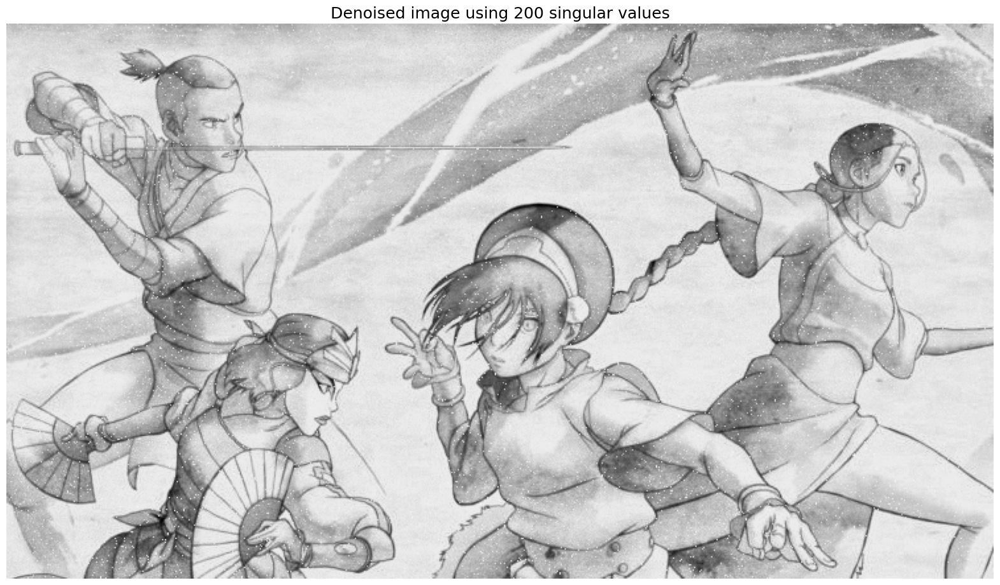

In [8]:
from copy import deepcopy

# add salt and pepper noise to the image
noise = np.random.binomial(1, .975, image.shape)
image_noisy = image * noise

# plot the noised image
plt.figure(figsize=(20,20))
plt.imshow(image_noisy, cmap='gray_r')
plt.title('Noised image', fontsize=18)
_ = plt.axis('off')

# perform SVD of the image
U, s, V = np.linalg.svd(image_noisy)

# denoising with two different low-rank approximations of the image
for i in [40, 200]:
    # get pixels from reconstruction
    proposed_pixels = lowrank_approx(U, s, V, i)
    denoised_image = deepcopy(image_noisy)
    # fill in new values for the missing pixels
    denoised_image[noise == 0] = proposed_pixels[noise == 0]

    # plot the result
    plt.figure(figsize=(20,20))
    plt.imshow(denoised_image, cmap='gray_r')
    plt.title('Denoised image using {} singular values'.format(i), fontsize=18)
    plt.axis('off')